In [1]:
import os
import xarray as xr
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy import stats
import tensorflow as tf

from holodecml.losses import unet_loss_xy


/glade/u/home/ggantos/miniconda3/envs/micro/lib/python3.6/site-packages/distributed/config.py:63: YAMLLoadWarning: calling yaml.load() without Loader=... is deprecated, as the default Loader is unsafe. Please read https://msg.pyyaml.org/load for full details.
  config.update(yaml.load(text))


In [2]:
path_data = "/glade/scratch/bansemer/real_holograms_CSET_RF07_20150719_203600-203700.nc"
ds = xr.open_dataset(path_data)
ds["image"].shape


(43, 4872, 3248)

In [3]:
path_data = "/glade/scratch/bansemer/real_holograms_CSET_RF07_20150719_200000-210000.nc"
ds = xr.open_dataset(path_data)
print(ds["image"].shape)
ds


(559, 4872, 3248)


<xarray.Dataset>
Dimensions:         (hologram_number: 559, particle: 158981, xsize: 4872, ysize: 3248)
Dimensions without coordinates: hologram_number, particle, xsize, ysize
Data variables:
    hid             (particle) float32 ...
    d               (particle) float32 ...
    x               (particle) float32 ...
    y               (particle) float32 ...
    z               (particle) float32 ...
    t               (particle) timedelta64[ns] ...
    x_pixels        (particle) float32 ...
    y_pixels        (particle) float32 ...
    image           (hologram_number, xsize, ysize) uint8 ...
    image_original  (hologram_number, xsize, ysize) uint8 ...
Attributes:
    DateCreated:              06-May-2021
    MinParticlesPerHologram:  20.0
    Nx:                       4872.0
    Ny:                       3248.0
    dx:                       2.96e-06
    dy:                       2.96e-06
    lambda:                   3.55e-07
    Nbits:                    8.0
    nHolograms:               559.0

In [4]:
padx = (512 - (ds["image"].shape[1] - 512*(ds["image"].shape[1]//512)))//2
pady = (512 - (ds["image"].shape[2] - 512*(ds["image"].shape[2]//512)))//2
print(f"padx:\t{padx}\npady:\t{pady}")
print(f"original shape:\t{ds['image'][0].shape}")
imagepadded = np.pad(ds["image"][0], ((padx, padx), (pady, pady)), constant_values=(0))
print(imagepadded.shape)
print(imagepadded.shape[0]/512)
print(imagepadded.shape[1]/512)

padx:	124
pady:	168
original shape:	(4872, 3248)
(5120, 3584)
10.0
7.0


In [5]:
print("x_pixels, y_pixels\n")
print(np.min(ds["x_pixels"].values), np.max(ds["x_pixels"].values))
print(np.min(ds["y_pixels"].values), np.max(ds["y_pixels"].values))


x_pixels, y_pixels

0.1891892 4870.4595
0.35135135 3246.6353


In [6]:
print("x, y\n")

print(np.min(ds["x"].values), np.max(ds["x"].values))
print(np.min(ds["y"].values), np.max(ds["y"].values))


x, y

-7210.0 7206.0
-4806.0 4803.0


In [7]:
x_length = 4872 * 2.96
y_length = 3248 * 2.96

print(x_length, y_length)


14421.119999999999 9614.08


In [8]:
x_scale = (4872 * 2.96)/2
y_scale = (3248 * 2.96)/2

print(x_scale, y_scale)


7210.5599999999995 4807.04


In [9]:
def get_linspace(input_shape, num_bins=False):
    if num_bins:
        num_bins_x, num_bins_y = num_bins
    else:
        num_bins_x = input_shape[0]
        num_bins_y = input_shape[1]

    if input_shape == (600, 400):
        return np.linspace(-888, 888, num_bins_x), np.linspace(-592, 592, num_bins_y)
    if input_shape == (512, 512):
        return np.linspace(-757, 757, num_bins_x), np.linspace(-757, 757, num_bins_y)
    if input_shape == (1200, 800):
        return np.linspace(-1776, 1776, num_bins_x), np.linspace(-1184, 1184, num_bins_y)
    if input_shape == (4872, 3248):
        return np.linspace(-7210, 7210, num_bins_x), np.linspace(-4806, 4806, num_bins_y)


In [10]:
def unet_bin_xy(inputs, outputs, bin_factor):
        
    if not bin_factor:
        num_bins_x = inputs.shape[1]
        num_bins_y = inputs.shape[2]
    else:
        num_bins_x = inputs.shape[1] // bin_factor
        num_bins_y = inputs.shape[2] // bin_factor
    
    unet_outputs = []
    for hid in outputs["hid"].unique():
        outputs_hid = outputs.loc[outputs['hid'] == hid]
        x_linspace, y_linspace = get_linspace(inputs[0].shape, (num_bins_x, num_bins_y))
        xs_hid = np.digitize(outputs_hid['x'], x_linspace)
        ys_hid = np.digitize(outputs_hid['y'], y_linspace)

        #sort coordinates on first x-axis then y-axis, eliminate non-unique
        coords_hid = np.array(list(zip(xs_hid,ys_hid)))
        coords_hid = coords_hid[np.lexsort((coords_hid[:,1], coords_hid[:,0]))]
        unique, unique_idx, unique_counts = np.unique(coords_hid,
                                                      return_index=True,
                                                      return_counts=True,
                                                      axis=0)
        xy = np.zeros((num_bins_x, num_bins_y))
        xy[unique[:, 0], unique[:, 1]] = 1
        unet_outputs.append(np.expand_dims(xy, axis=-1))
    unet_outputs = np.stack(unet_outputs, axis=0)
    return unet_outputs


In [11]:
train_outputs = unet_bin_xy(ds["image"],
                            ds[["hid", "x", "y", "z", "d"]].to_dataframe(),
                            8)

82.0


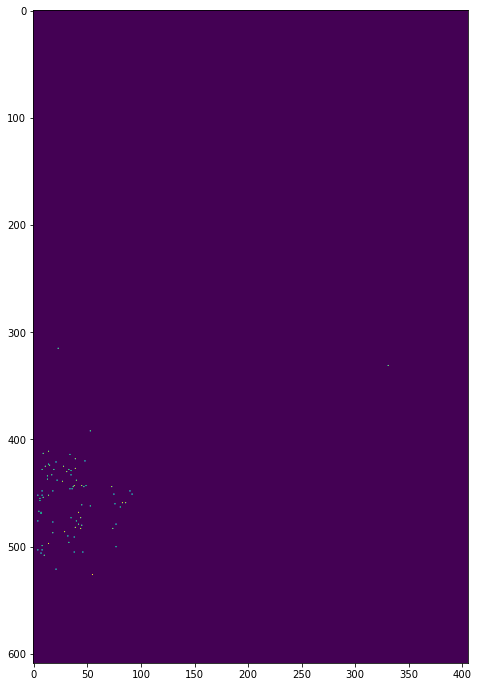

65.0


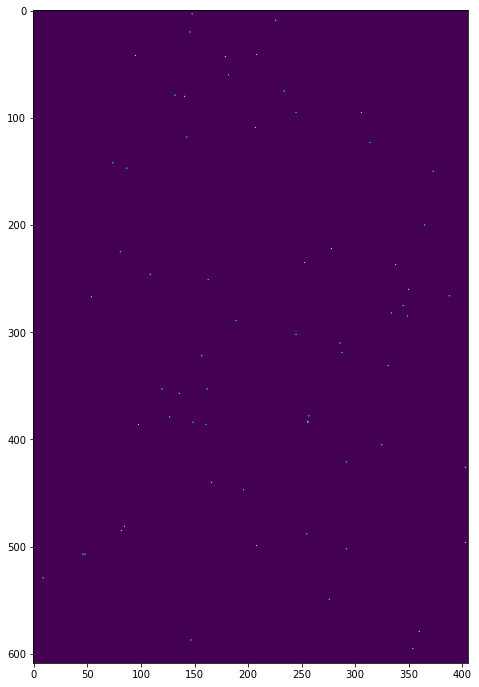

123.0


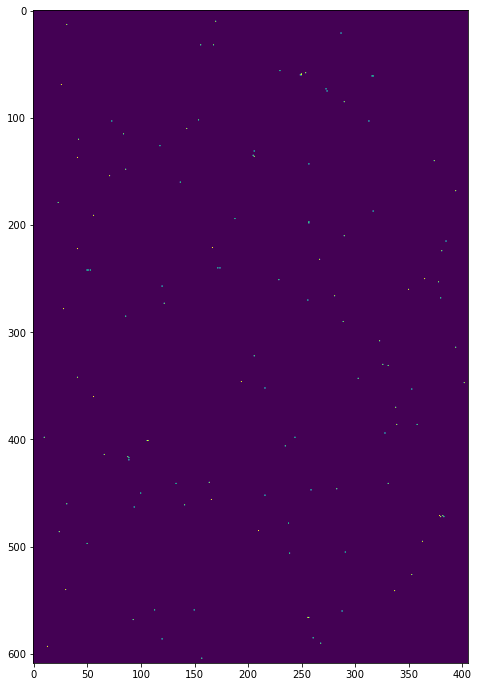

24.0


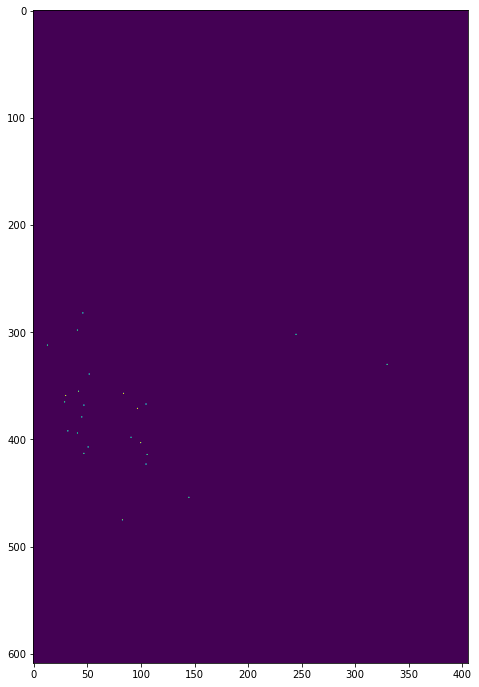

27.0


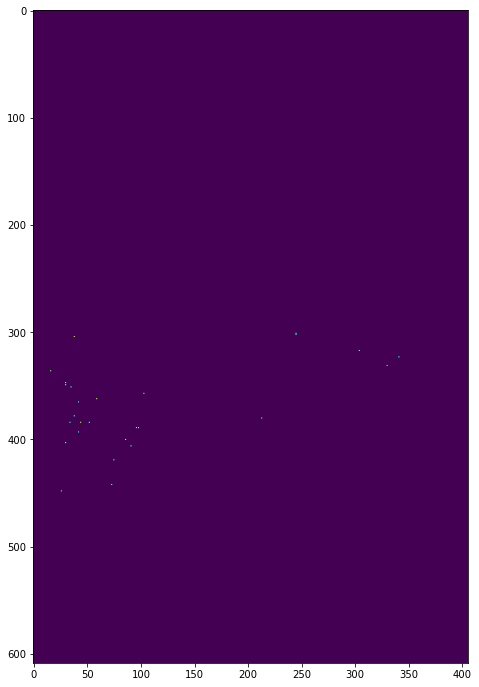

28.0


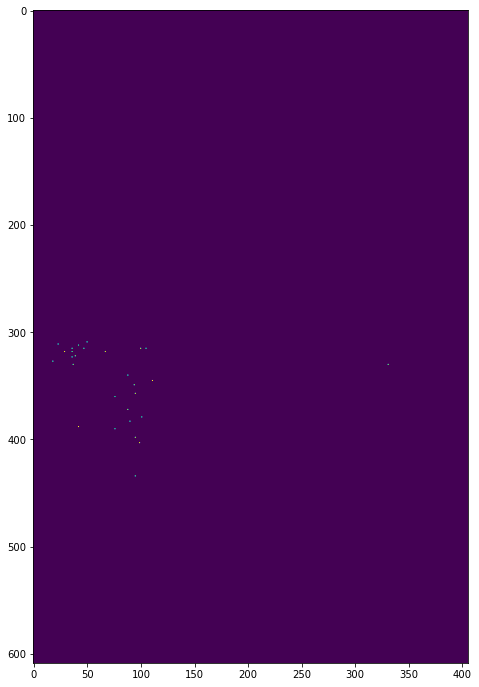

31.0


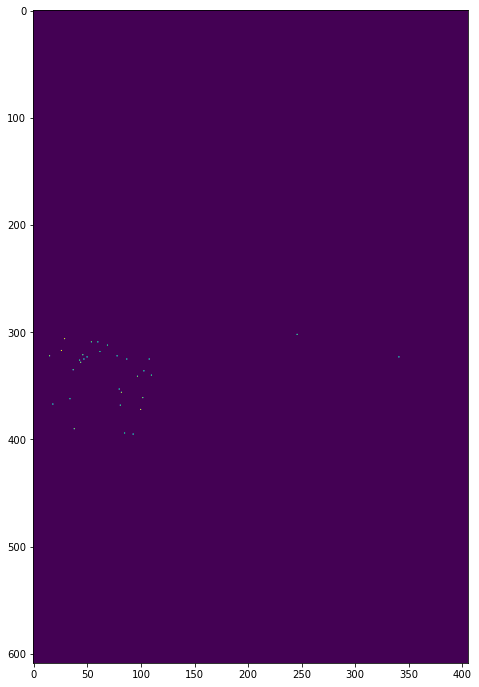

25.0


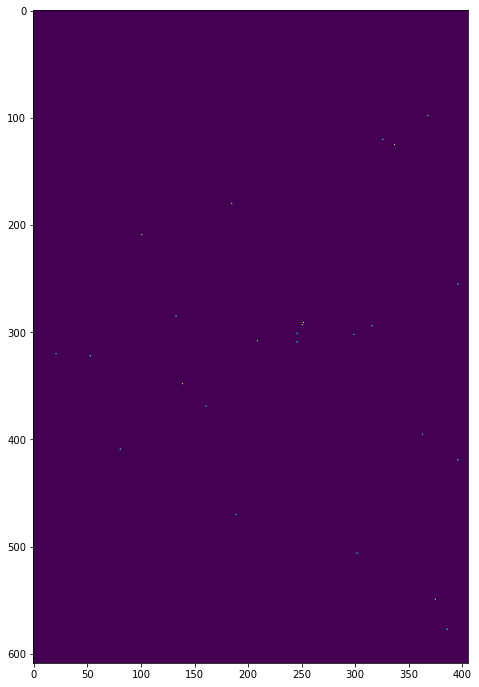

134.0


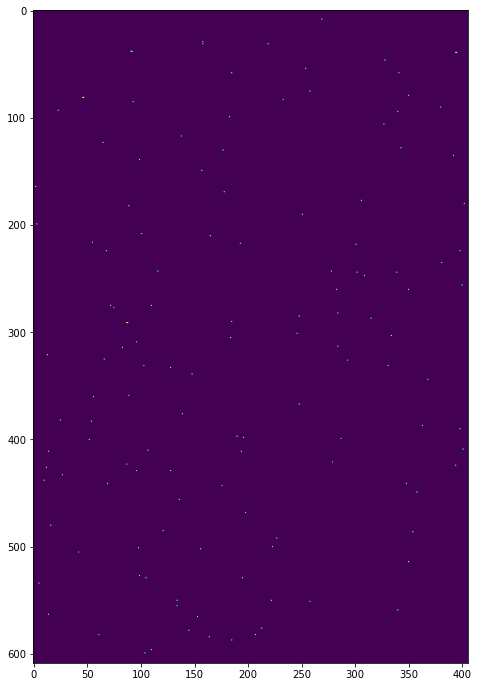

115.0


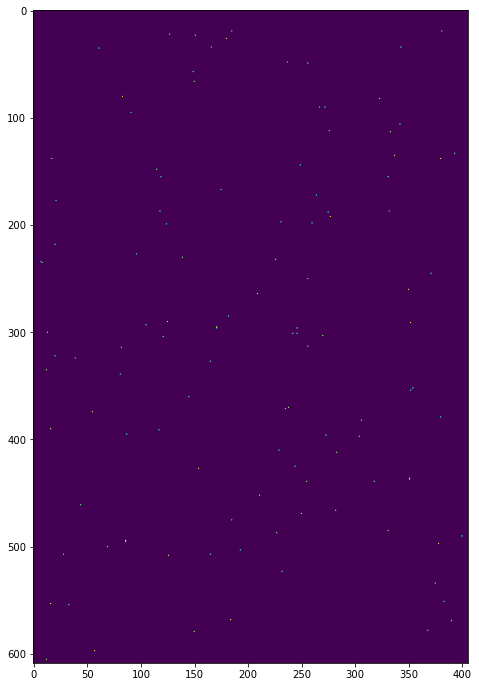

In [12]:
for h in range(10):
    print(np.sum(train_outputs[h, :, :, 0]))
    plt.figure(figsize=(16, 12))
    plt.imshow(train_outputs[h, :, :, 0])
    plt.show()


In [13]:
ds.hid.values

array([  1.,   1.,   1., ..., 559., 559., 559.], dtype=float32)

In [14]:
unique, counts = np.unique(ds.hid.values, return_counts=True)
unique_counts = dict(zip(unique, counts))
unique_counts[1]

82

In [15]:
type(ds["image"][h].values)

numpy.ndarray

In [17]:
padx = (64 - (train_outputs.shape[1] - 64*(train_outputs.shape[1]//64)))//2
pady = (64 - (train_outputs.shape[2] - 64*(train_outputs.shape[2]//64)))//2
print(f"padx:\t{padx}\npady:\t{pady}")
print(f"original shape:\t{train_outputs[0, :, :, 0].shape}")
imagepadded = np.pad(train_outputs[0, :, :, 0], ((padx, padx+1), (pady, pady)), constant_values=(0))
print(imagepadded.shape)
print(imagepadded.shape[0]/64)
print(imagepadded.shape[1]/64)


padx:	15
pady:	21
original shape:	(609, 406)
(640, 448)
10.0
7.0


In [18]:
np.linspace(0, 640, 11)
np.linspace(0, 5120, 11)
np.linspace(-7210-int(124*2.96), 7210+int(124*2.96), 11)


array([-7577. , -6061.6, -4546.2, -3030.8, -1515.4,     0. ,  1515.4,
        3030.8,  4546.2,  6061.6,  7577. ])

In [19]:
np.linspace(0, 448, 8)
np.linspace(0, 3584, 8)
np.linspace(-4806-int(168*2.96), 4806+int(168*2.96), 8)


array([-5303.        , -3787.85714286, -2272.71428571,  -757.57142857,
         757.57142857,  2272.71428571,  3787.85714286,  5303.        ])

In [20]:
train_outputs_padded = np.pad(train_outputs, ((0,0), (padx, padx), (pady, pady), (0,0)), constant_values=(0))


In [21]:
x = [0.1, 0.1, 0.1, 0.6]
y = [2.1, 2.6, 2.1, 2.1]
binx = [0.0, 0.5, 1.0]
biny = [2.0, 2.5, 3.0]
ret = stats.binned_statistic_2d(x, y, None, 'count', bins=[binx, biny], expand_binnumbers=True)
ret.binnumber


array([[1, 1, 1, 2],
       [1, 2, 1, 1]])

In [22]:
padx = (512 - (ds["image"].shape[1] - 512*(ds["image"].shape[1]//512)))//2
pady = (512 - (ds["image"].shape[2] - 512*(ds["image"].shape[2]//512)))//2
imagepadded = np.pad(ds["image"][0], ((padx, padx), (pady, pady)), constant_values=(0))

df = ds[["hid", "x", "y", "z", "d", "x_pixels", "y_pixels"]].to_dataframe()
df["hid_orig"] = df["hid"]
df["x_pixels"] = df["x_pixels"] + 124
df["y_pixels"] = df["y_pixels"] + 168
x_oldrange = np.linspace(-7210-int(124*2.96), 7210+int(124*2.96), 11)
y_oldrange = np.linspace(-4806-int(168*2.96), 4806+int(168*2.96), 8)


inputs = []
outputs = []
hid = 1
for h in range(int(ds.nHolograms)):
    # subset data to represent only a single hologram (4872 x 3248)
    image = ds["image"][h]
    df_image = df[(df['hid'] == h + 1)].reset_index()
    
    # pad image
    image = np.pad(image, ((padx, padx), (pady, pady)), constant_values=(0))
    
    # 2d binning of all particles on the padded hologram (5120 x 3584) 
    ret = stats.binned_statistic_2d(df_image["x_pixels"],
                                    df_image["y_pixels"],
                                    None,
                                    'count',
                                    bins=[np.linspace(0, 5120, 11), np.linspace(0, 3584, 8)],
                                    expand_binnumbers=True)
    particle_bins = np.swapaxes(ret.binnumber, 0, 1)
    
    # loop through each excised hologram patch
    for i in range(1, 11):
        omin_x = min(x_oldrange[i-1:i+1])
        omax_x = max(x_oldrange[i-1:i+1])
        for j in range(1, 8):
            
            # excise patch from larger image
            image_hid = image[(i-1)*512:i*512, (j-1)*512:j*512]
            
            # grab all particle indices where 2D binning above matches this hologram patch
            particle_idx = np.where((particle_bins == (i,j)).all(axis=1))
            patch_df = df_image.loc[particle_idx[0], :]
            
            if patch_df.shape[0] != 0:
                # start revising the excised patch values
                patch_df['hid'] = hid

                # update x and y values for excised holograms
                omax_y = max(y_oldrange[j-1:j+1])
                omin_y = min(y_oldrange[j-1:j+1])
                patch_df['x'] = ((patch_df['x'] - omin_x) / (omax_x - omin_x)) * (757 + 757) - 757
                patch_df['y'] = ((patch_df['y'] - omin_y) / (omax_y - omin_y)) * (757 + 757) - 757

                # update x_pixels and y_pixels values for excised hologram
                x_linspace, y_linspace = get_linspace((512,512), (512, 512))
                patch_df['x_pixels'] = np.digitize(patch_df['x'], x_linspace)
                patch_df['y_pixels'] = np.digitize(patch_df['y'], y_linspace)
            
                # append excised data
                inputs.append(image_hid)
                outputs.append(patch_df)
            
            hid += 1

inputs = np.stack(inputs)
outputs = np.vstack(outputs)
outputs = pd.DataFrame(outputs, columns=patch_df.columns)

print("Inputs", inputs.shape)
print("Outputs", outputs.shape)


Inputs (25399, 512, 512)
Outputs (158981, 9)


In [23]:
outputs

,particle,hid,x,y,z,d,x_pixels,y_pixels,hid_orig
0,31.0,36.0,-517.221741,279.217773,74900.0,10.020007,81.0,350.0,1.0
1,14.0,41.0,-135.574646,-2.284058,54400.0,12.935773,210.0,255.0,1.0
2,6.0,43.0,651.297729,179.293213,37900.0,10.020007,476.0,317.0,1.0
3,8.0,43.0,662.287598,501.050415,41600.0,8.836815,480.0,425.0,1.0
4,12.0,43.0,478.457520,214.266846,51700.0,7.468472,417.0,328.0,1.0
...,...,...,...,...,...,...,...,...,...
158976,158965.0,39110.0,742.813110,-29.549133,106100.0,6.680005,507.0,246.0,559.0
158977,158974.0,39111.0,-393.136536,292.065308,132400.0,9.446953,123.0,355.0,559.0
158978,158963.0,39112.0,-754.802063,394.844849,103400.0,6.680005,1.0,389.0,559.0
158979,158975.0,39114.0,513.025513,515.468140,133300.0,12.935773,429.0,430.0,559.0


In [24]:
data = xr.DataArray({"inputs": inputs, "outputs": outputs})
data = xr.Dataset(
    data_vars={
        "image": (("hid", "x", "y"), inputs),
        "particle": outputs["particle"],
        "hid": outputs["hid"],
        "x": outputs["x"],
        "y": outputs["y"],
        "z": outputs["z"],
        "d": outputs["d"],
        "x_pixels": outputs["x_pixels"],
        "y_pixels": outputs["y_pixels"],
        "hid_orig": outputs["hid_orig"]
    }
)

In [25]:
data

<xarray.Dataset>
Dimensions:   (dim_0: 158981, hid: 25399, x: 512, y: 512)
Coordinates:
  * dim_0     (dim_0) int64 0 1 2 3 4 5 ... 158976 158977 158978 158979 158980
    hid       (dim_0) float64 36.0 41.0 43.0 ... 3.911e+04 3.911e+04 3.913e+04
    x         (dim_0) float64 -517.2 -135.6 651.3 662.3 ... -754.8 513.0 -317.0
    y         (dim_0) float64 279.2 -2.284 179.3 501.1 ... 394.8 515.5 706.2
Data variables:
    image     (hid, x, y) uint8 0 0 0 0 0 0 0 0 0 0 0 ... 0 0 0 0 0 0 0 0 0 0 0
    particle  (dim_0) float64 31.0 14.0 6.0 8.0 ... 1.59e+05 1.59e+05 1.59e+05
    z         (dim_0) float64 7.49e+04 5.44e+04 3.79e+04 ... 1.333e+05 9.78e+04
    d         (dim_0) float64 10.02 12.94 10.02 8.837 ... 9.447 6.68 12.94 6.68
    x_pixels  (dim_0) float64 81.0 210.0 476.0 480.0 ... 123.0 1.0 429.0 149.0
    y_pixels  (dim_0) float64 350.0 255.0 317.0 425.0 ... 389.0 430.0 494.0
    hid_orig  (dim_0) float64 1.0 1.0 1.0 1.0 1.0 ... 559.0 559.0 559.0 559.0

In [26]:
data.to_netcdf("/glade/p/cisl/aiml/ai4ess_hackathon/holodec/real_holograms_CSET_RF07_20150719_200000-210000_512x512.nc")

82


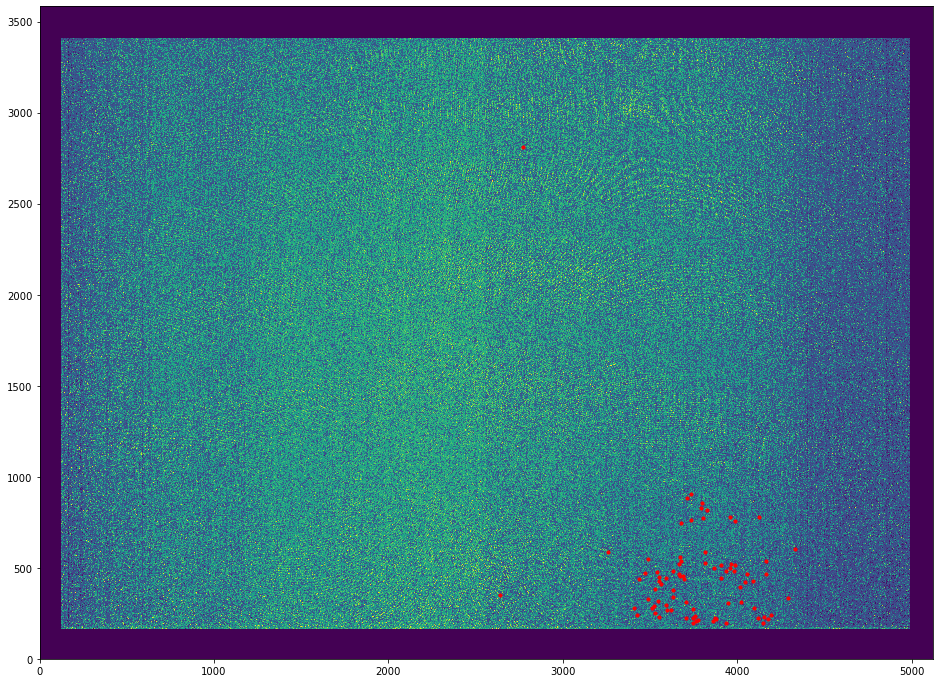

65


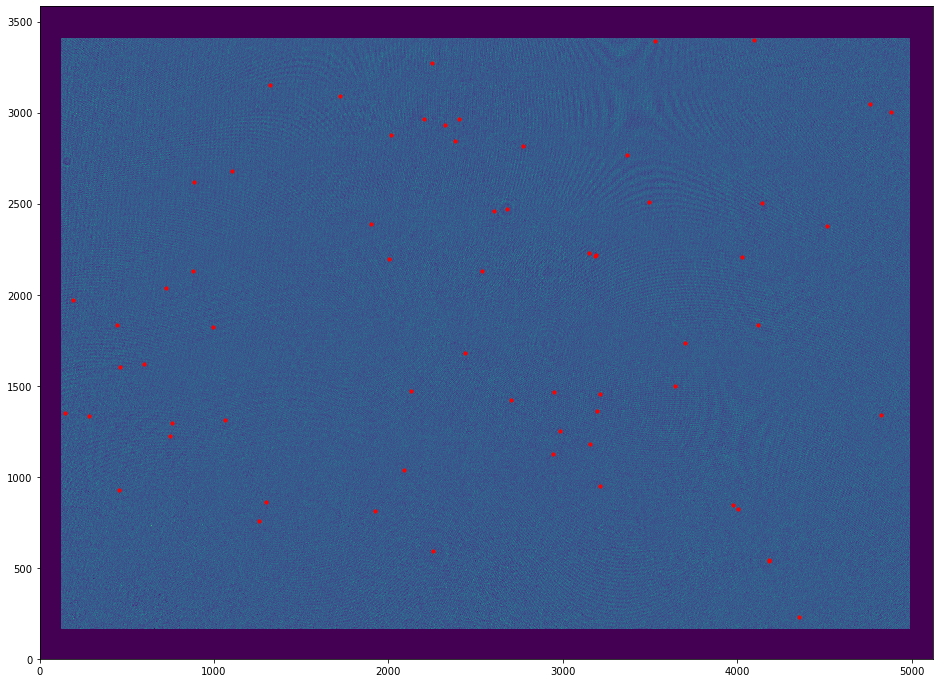

125


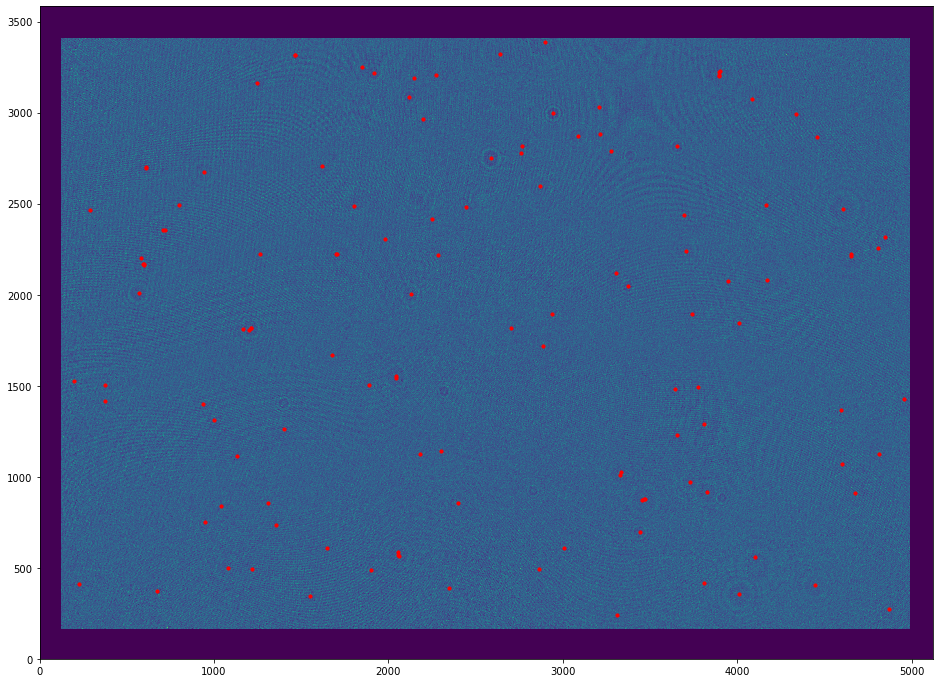

24


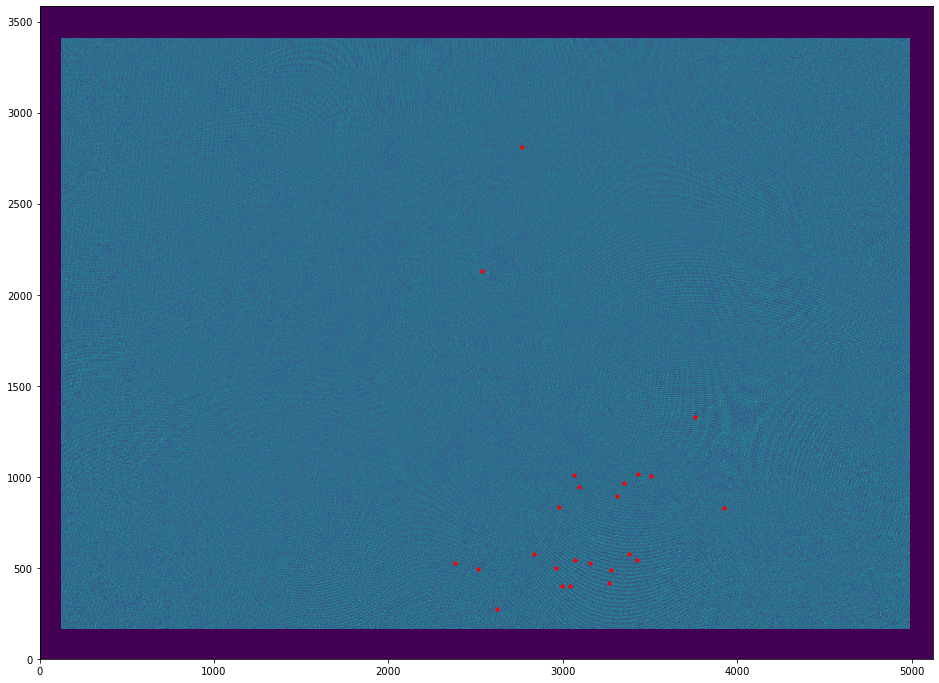

27


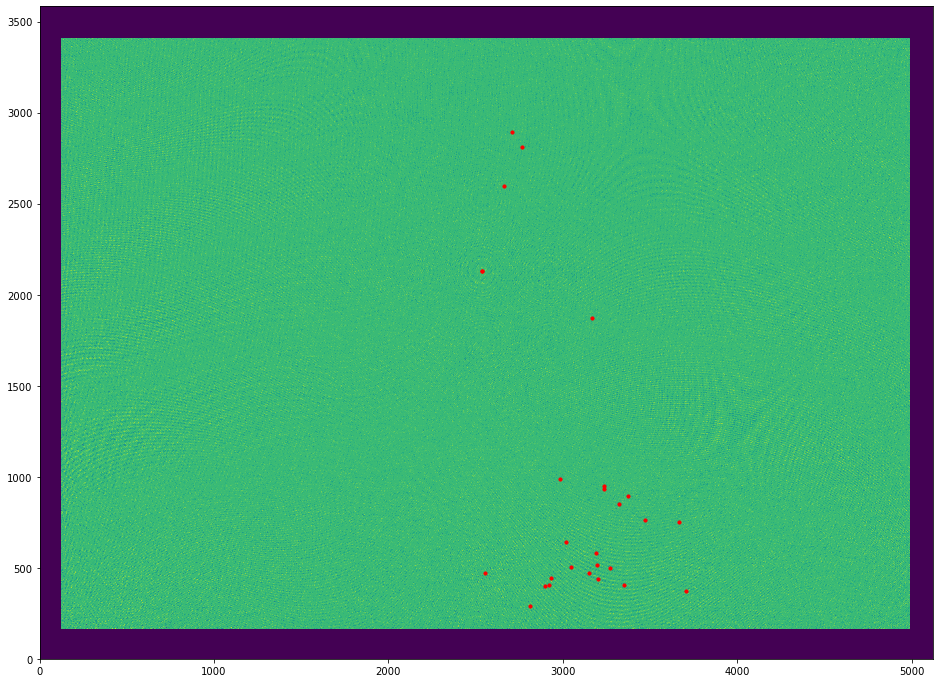

28


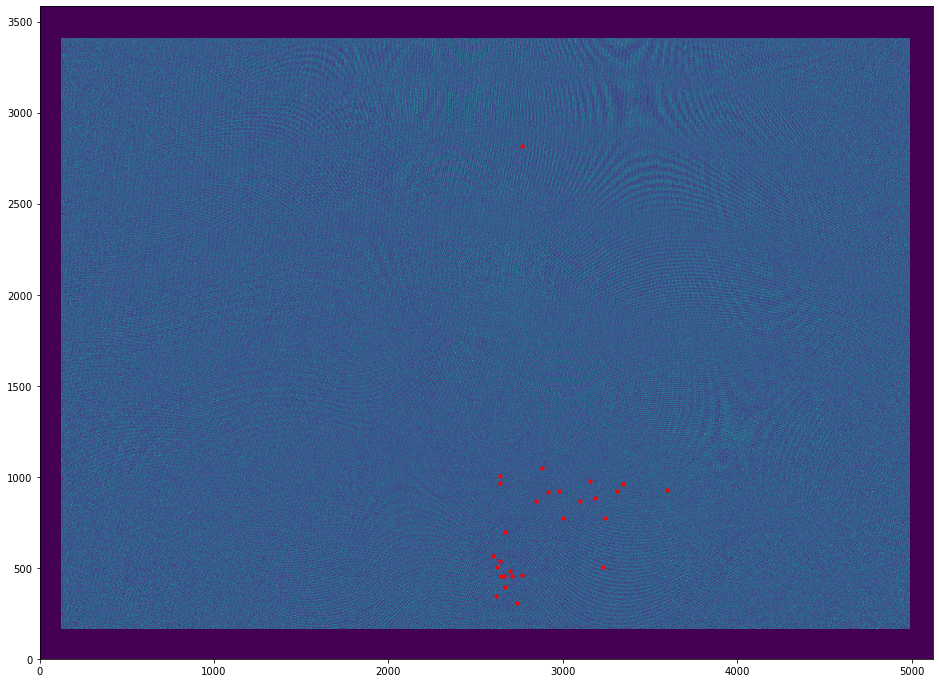

32


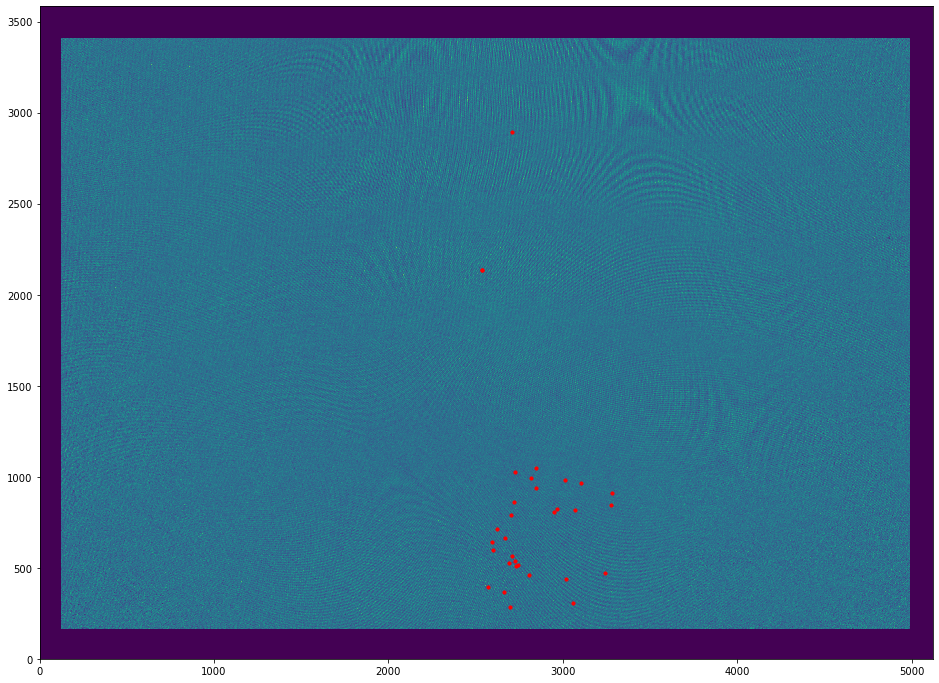

25


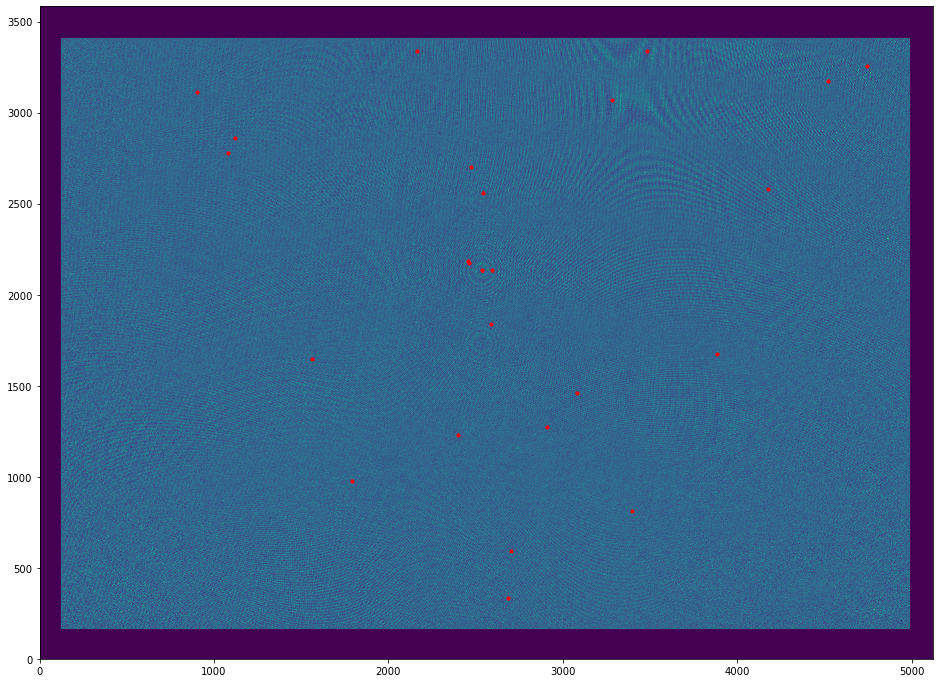

135


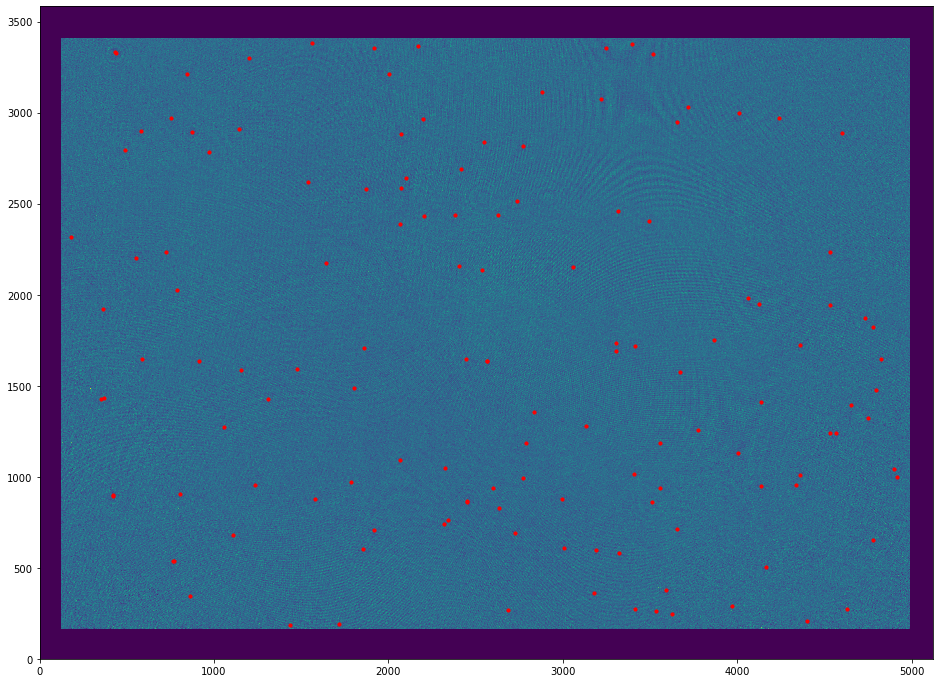

119


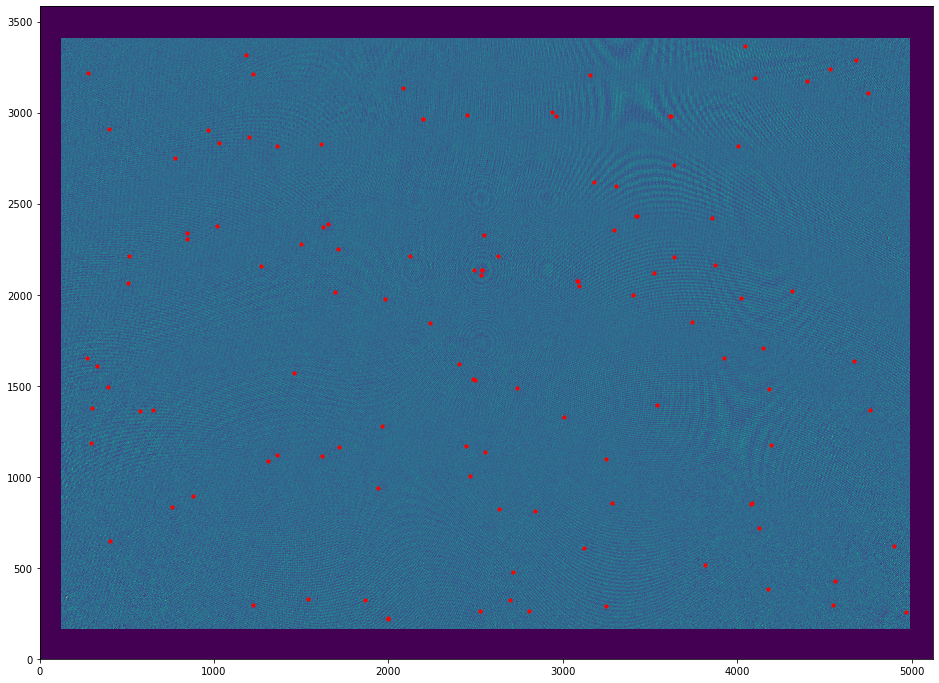

In [27]:
for h in range(10):
    coords_true = df[(df['hid'] == h + 1)]
    print(unique_counts[h+1])
    plt.figure(figsize=(16, 12))
    padded_image = np.pad(ds["image"][h].values, ((padx, padx), (pady, pady)), constant_values=(0))
    plt.pcolormesh(padded_image.T)
    plt.scatter(coords_true['x_pixels'].values.astype('int'),
                coords_true['y_pixels'].values.astype('int'),
                s=10,
                c='red',
                label="True")
    plt.show()

In [28]:
path_model = "/glade/p/cisl/aiml/ggantos/holodec/unet/jnet_10_512/"
model = tf.keras.models.load_model(path_model, custom_objects={'unet_loss_xy': unet_loss_xy})
model.summary()


Model: "functional_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 512, 512, 1) 0                                            
__________________________________________________________________________________________________
conv2d (Conv2D)                 (None, 512, 512, 64) 576         input_1[0][0]                    
__________________________________________________________________________________________________
batch_normalization (BatchNorma (None, 512, 512, 64) 256         conv2d[0][0]                     
__________________________________________________________________________________________________
spatial_dropout2d (SpatialDropo (None, 512, 512, 64) 0           batch_normalization[0][0]        
_______________________________________________________________________________________

In [30]:
from sklearn.preprocessing import StandardScaler, MinMaxScaler, MaxAbsScaler, RobustScaler

path_data = "/glade/p/cisl/aiml/ai4ess_hackathon/holodec/"
num_particles = "real"
output_cols = ["x", "y", "z", "d", "hid"]
subset = 0.01
scaler_out = MinMaxScaler()
bin_factor = 8
input_col="image"


In [31]:
from holodecml.data import load_unet_datasets_xy

train_inputs,\
train_outputs,\
valid_inputs,\
valid_outputs = load_unet_datasets_xy(path_data,
                                     num_particles,
                                     output_cols,
                                     subset,
                                     bin_factor)

In [32]:
train_outputs_pred = model.predict(np.expand_dims(train_inputs, axis=-1),
                                   batch_size=64)

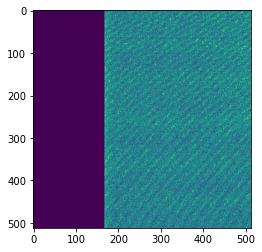

In [61]:
plt.imshow(train_inputs[0])

In [ ]:
for h in range(10):
    coords_true = np.where(image_true > 0)
    print(unique_counts[h+1])
    plt.figure(figsize=(16, 12))
    padded_image = np.pad(ds["image"][h].values, ((padx, padx), (pady, pady)), constant_values=(0))
    plt.pcolormesh(padded_image.T)
    plt.scatter(coords_true['x_pixels'].values.astype('int'),
                coords_true['y_pixels'].values.astype('int'),
                s=10,
                c='red',
                label="True")
    plt.show()

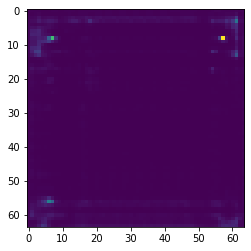

In [58]:
plt.imshow(train_outputs_pred[10, :, :, 0])

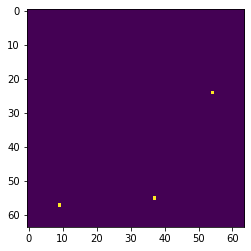

In [56]:
plt.imshow(train_outputs[10, :, :, 0])